In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
import xgboost as xgb
from xgboost import plot_importance
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
from helper import create_dummy_df
import bokeh
import geopandas as gpd
from pyproj import CRS
import folium
from folium.plugins import MarkerCluster

%matplotlib inline

df_listings = pd.read_csv('../NYC/data/listings.csv', low_memory=False, verbose=1)

df_listings.head()

Tokenization took: 670.98 ms
Type conversion took: 1593.28 ms
Parser memory cleanup took: 19.95 ms


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2060,https://www.airbnb.com/rooms/2060,20200608144437,2020-06-09,Modern NYC,NaN,"Lovely, spacious, sunny 1 BR apartment in 6th ...","Lovely, spacious, sunny 1 BR apartment in 6th ...",none,NaN,...,f,f,flexible,f,f,1,0,1,0,0.01
1,2595,https://www.airbnb.com/rooms/2595,20200608144437,2020-06-09,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...","- Spacious (500+ft²), immaculate and nicely fu...","Beautiful, spacious skylit studio in the heart...",none,Centrally located in the heart of Manhattan ju...,...,f,f,strict_14_with_grace_period,t,t,2,2,0,0,0.37
2,3831,https://www.airbnb.com/rooms/3831,20200608144437,2020-06-09,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",We host on the entire top floor of our double-...,"Enjoy 500 s.f. top floor in 1899 brownstone, w...",none,Just the right mix of urban center and local n...,...,f,f,flexible,f,f,1,1,0,0,4.64
3,5099,https://www.airbnb.com/rooms/5099,20200608144437,2020-06-09,Large Cozy 1 BR Apartment In Midtown East,My large 1 bedroom apartment has a true New Yo...,I have a large 1 bedroom apartment centrally l...,My large 1 bedroom apartment has a true New Yo...,none,My neighborhood in Midtown East is called Murr...,...,f,f,moderate,t,t,1,1,0,0,0.58
4,5121,https://www.airbnb.com/rooms/5121,20200608144437,2020-06-09,BlissArtsSpace!,NaN,HELLO EVERYONE AND THANKS FOR VISITING BLISS A...,HELLO EVERYONE AND THANKS FOR VISITING BLISS A...,none,NaN,...,f,f,strict_14_with_grace_period,f,f,1,0,1,0,0.37


In [2]:
# Listing columns name
list(df_listings)

['id',
 'listing_url',
 'scrape_id',
 'last_scraped',
 'name',
 'summary',
 'space',
 'description',
 'experiences_offered',
 'neighborhood_overview',
 'notes',
 'transit',
 'access',
 'interaction',
 'house_rules',
 'thumbnail_url',
 'medium_url',
 'picture_url',
 'xl_picture_url',
 'host_id',
 'host_url',
 'host_name',
 'host_since',
 'host_location',
 'host_about',
 'host_response_time',
 'host_response_rate',
 'host_acceptance_rate',
 'host_is_superhost',
 'host_thumbnail_url',
 'host_picture_url',
 'host_neighbourhood',
 'host_listings_count',
 'host_total_listings_count',
 'host_verifications',
 'host_has_profile_pic',
 'host_identity_verified',
 'street',
 'neighbourhood',
 'neighbourhood_cleansed',
 'neighbourhood_group_cleansed',
 'city',
 'state',
 'zipcode',
 'market',
 'smart_location',
 'country_code',
 'country',
 'latitude',
 'longitude',
 'is_location_exact',
 'property_type',
 'room_type',
 'accommodates',
 'bathrooms',
 'bedrooms',
 'beds',
 'bed_type',
 'amenities',


In [3]:
df_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49530 entries, 0 to 49529
Columns: 106 entries, id to reviews_per_month
dtypes: float64(21), int64(21), object(64)
memory usage: 40.1+ MB


In [4]:
df_listings.neighbourhood_group_cleansed.value_counts()

Manhattan        21963
Brooklyn         19931
Queens            6068
Bronx             1198
Staten Island      370
Name: neighbourhood_group_cleansed, dtype: int64

In [5]:
df_listings.neighbourhood_cleansed.value_counts()

Williamsburg                  3752
Bedford-Stuyvesant            3736
Harlem                        2649
Bushwick                      2431
Hell's Kitchen                2076
                              ... 
Fort Wadsworth                   1
Gerritsen Beach                  1
Huguenot                         1
Willowbrook                      1
Bay Terrace, Staten Island       1
Name: neighbourhood_cleansed, Length: 222, dtype: int64

In [6]:
df_listings.neighbourhood_cleansed.isna().sum()

0

In [7]:
df_listings.neighbourhood_group_cleansed.isna().sum()

0

In [8]:
df_listings.neighbourhood.isna().sum()

11

In [9]:
df_listings.neighbourhood.value_counts()

Brooklyn              10973
Manhattan             10290
Queens                 3114
Bedford-Stuyvesant     1784
Williamsburg           1664
                      ...  
Huguenot                  1
Mill Basin                1
Todt Hill                 1
Mount Eden                1
Graniteville              1
Name: neighbourhood, Length: 196, dtype: int64

In [10]:
df_listings.host_total_listings_count.isna().sum()

6

In [11]:
df_listings.host_total_listings_count.value_counts()

1.0      26539
2.0       7017
0.0       5138
3.0       2957
4.0       1680
         ...  
65.0         1
38.0         1
299.0        1
392.0        1
365.0        1
Name: host_total_listings_count, Length: 88, dtype: int64

In [12]:
df_listings.host_listings_count.value_counts()

1.0      26539
2.0       7017
0.0       5138
3.0       2957
4.0       1680
         ...  
65.0         1
38.0         1
299.0        1
392.0        1
365.0        1
Name: host_listings_count, Length: 88, dtype: int64

In [13]:
sum((df_listings.minimum_nights == df_listings.minimum_minimum_nights) == False)

1540

In [14]:
drop_first =['listing_url', 'scrape_id', 'last_scraped', 'name', 'summary', 
             'space', 'description', 'experiences_offered','neighborhood_overview', 'notes', 
             'transit', 'access', 'interaction', 'house_rules', 'thumbnail_url', 
             'medium_url', 'picture_url', 'xl_picture_url', 'host_id', 'host_url', 
             'host_name', 'host_location', 'host_about', 'host_acceptance_rate','host_thumbnail_url', 
             'host_picture_url', 'host_neighbourhood', 'host_total_listings_count', 'host_verifications', 
             'host_has_profile_pic', 'host_identity_verified', 'street', 'neighbourhood', 'city', 'state', #6 features
             'zipcode', 'market', 'smart_location', 'country_code', 'country',
             'is_location_exact', 'square_feet' ,'weekly_price', 'monthly_price','minimum_minimum_nights',
             'maximum_minimum_nights','minimum_maximum_nights','maximum_maximum_nights','minimum_nights_avg_ntm','maximum_nights_avg_ntm',
             'calendar_last_scraped', 'requires_license', 'license','jurisdiction_names', 'instant_bookable', 
             'is_business_travel_ready','require_guest_profile_picture', 'require_guest_phone_verification', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 
             'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms' 
            ]
df = df_listings.drop(drop_first, axis=1)

df.head()

,id,host_since,host_response_time,host_response_rate,host_is_superhost,host_listings_count,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,...,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,cancellation_policy,reviews_per_month
0,2060,2008-08-18,a few days or more,0%,f,0.0,Washington Heights,Manhattan,40.85722,-73.93790,...,2008-09-22,80.0,NaN,NaN,NaN,NaN,NaN,NaN,flexible,0.01
1,2595,2008-09-09,within a few hours,84%,f,6.0,Midtown,Manhattan,40.75362,-73.98377,...,2019-11-04,94.0,9.0,9.0,10.0,10.0,10.0,9.0,strict_14_with_grace_period,0.37
2,3831,2008-12-07,within an hour,97%,f,1.0,Clinton Hill,Brooklyn,40.68514,-73.95976,...,2020-06-07,89.0,8.0,9.0,9.0,9.0,9.0,8.0,flexible,4.64
3,5099,2009-02-02,NaN,NaN,f,1.0,Murray Hill,Manhattan,40.74767,-73.97500,...,2019-10-13,90.0,10.0,9.0,10.0,10.0,10.0,9.0,moderate,0.58
4,5121,2009-02-03,NaN,NaN,f,1.0,Bedford-Stuyvesant,Brooklyn,40.68688,-73.95596,...,2019-12-02,90.0,8.0,8.0,10.0,10.0,9.0,9.0,strict_14_with_grace_period,0.37


In [15]:
df_latlong = df[['id', 'latitude', 'longitude']]
df_latlong.set_index('id', inplace=True)
df.drop(['latitude', 'longitude'], axis=1, inplace=True)

In [16]:
df.set_index('id', inplace=True)

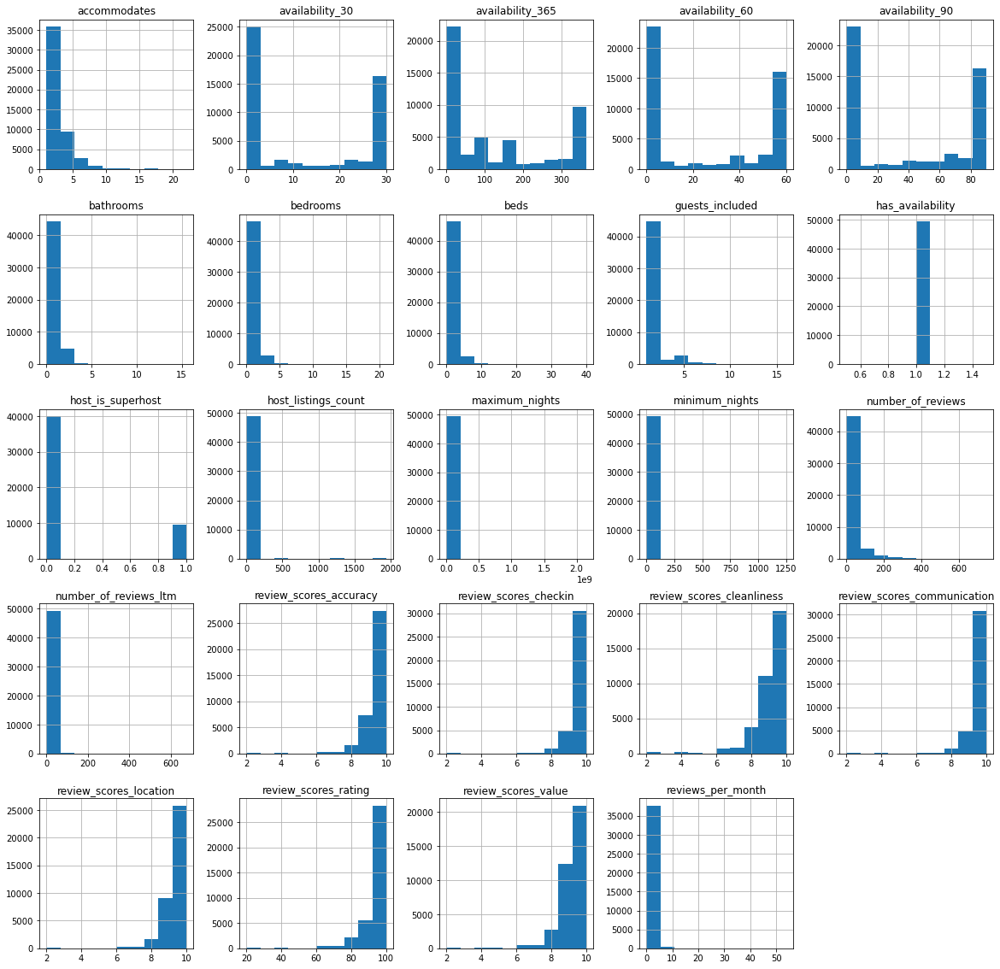

In [17]:
# Replacing columns with f/t with 0/1
df.replace({'f': 0, 't': 1}, inplace=True)

# Distribution of numerical and boolean categories
df.hist(figsize=(20,20));

In [18]:
df.drop('has_availability', axis=1, inplace=True)

In [19]:
list(df)

['host_since',
 'host_response_time',
 'host_response_rate',
 'host_is_superhost',
 'host_listings_count',
 'neighbourhood_cleansed',
 'neighbourhood_group_cleansed',
 'property_type',
 'room_type',
 'accommodates',
 'bathrooms',
 'bedrooms',
 'beds',
 'bed_type',
 'amenities',
 'price',
 'security_deposit',
 'cleaning_fee',
 'guests_included',
 'extra_people',
 'minimum_nights',
 'maximum_nights',
 'calendar_updated',
 'availability_30',
 'availability_60',
 'availability_90',
 'availability_365',
 'number_of_reviews',
 'number_of_reviews_ltm',
 'first_review',
 'last_review',
 'review_scores_rating',
 'review_scores_accuracy',
 'review_scores_cleanliness',
 'review_scores_checkin',
 'review_scores_communication',
 'review_scores_location',
 'review_scores_value',
 'cancellation_policy',
 'reviews_per_month']

In [20]:
df= df.rename(columns={'neighbourhood_group_cleansed':'neighbourhood_group',
                      'neighbourhood_cleansed': 'neighbourhood'})


Mean days as host: 1761.0
Median days as host: 1792.0


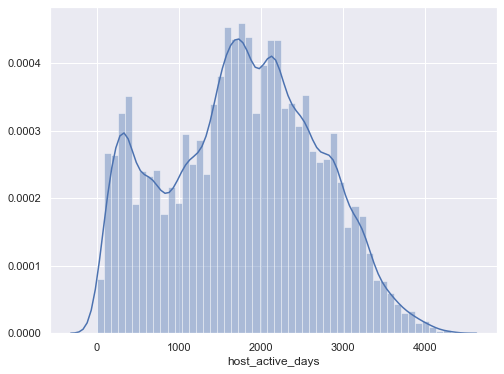

In [21]:
df.host_since = pd.to_datetime(df.host_since)
df['host_active_days'] = (datetime(2020, 6, 9) - df.host_since).astype('timedelta64[D]')

print("Mean days as host:", round(df['host_active_days'].mean(),0))
print("Median days as host:", df['host_active_days'].median())

sns.set()
plt.figure(figsize=(8,6))
sns.distplot(df['host_active_days']);

In [22]:
# Fill missing values with the median
df.host_active_days.fillna(df.host_active_days.median(), inplace=True)

In [23]:
df.host_response_time.isnull().sum()

27316

In [24]:
# % missing values
total = df.isnull().sum().sort_values(ascending=False)
percent = ((df.isnull().sum()) * 100) / df.isnull().count().sort_values(ascending=False)
missing = pd.concat([total, percent], axis=1, keys=['Total Missing Instances', '% Missing'], sort=False).sort_values('Total Missing Instances', ascending=False)
missing

,Total Missing Instances,% Missing
host_response_time,27316,55.150414
host_response_rate,27316,55.150414
security_deposit,17183,34.692106
review_scores_location,12337,24.908136
review_scores_value,12336,24.906118
review_scores_checkin,12334,24.902080
review_scores_accuracy,12321,24.875833
review_scores_communication,12317,24.867757
review_scores_cleanliness,12307,24.847567
review_scores_rating,12287,24.807188


In [25]:
df.host_response_time.fillna('unknown', inplace=True)
df.host_response_time.value_counts(normalize=True)

unknown               0.551504
within an hour        0.253341
within a few hours    0.099071
within a day          0.069009
a few days or more    0.027075
Name: host_response_time, dtype: float64

In [26]:
df.host_response_rate.value_counts()

100%    15669
0%        796
90%       719
80%       523
50%       451
        ...  
5%          1
61%         1
2%          1
59%         1
7%          1
Name: host_response_rate, Length: 81, dtype: int64

In [27]:
# Removing % sign in host_response_rate
df.host_response_rate = df.host_response_rate.str[:-1].astype('float64')

# Bin into four categories
df.host_response_rate = pd.cut(df.host_response_rate, bins=[0, 50, 90, 99, 100], labels=['0-49%', '50-89%', '90-99%', '100%'], include_lowest=True)

# Converting to string
df.host_response_rate = df.host_response_rate.astype('str')

# Replace nulls with 'unknown'
df.host_response_rate.replace('nan', 'unknown', inplace=True)

# Category counts
df.host_response_rate.value_counts()

unknown    27316
100%       15669
50-89%      3542
0-49%       1792
90-99%      1211
Name: host_response_rate, dtype: int64

In [28]:
df.host_response_rate.isnull().sum()

0

In [29]:
df.dropna(subset=['host_since', 'host_is_superhost', 'host_listings_count'], inplace=True)

In [30]:
df.host_since.isnull().sum()

0

In [31]:
df.host_is_superhost.isnull().sum()

0

In [32]:
df.host_listings_count.isnull().sum()

0

In [33]:
df.security_deposit.value_counts()

$0.00        13098
$100.00       3750
$500.00       3379
$200.00       2551
$300.00       1854
             ...  
$730.00          1
$1,574.00        1
$1,270.00        1
$1,075.00        1
$3,695.00        1
Name: security_deposit, Length: 221, dtype: int64

In [34]:
df.security_deposit.isnull().sum()

17180

In [35]:
# Remove currency sign and fill missing values
df.security_deposit = df.security_deposit.str[1:-3]
df.security_deposit = df.security_deposit.str.replace(",", "")
df.security_deposit.fillna(0, inplace=True)
df.security_deposit = df.security_deposit.astype('float64')

In [36]:
df.security_deposit.value_counts()

0.0       30278
100.0      3750
500.0      3379
200.0      2551
300.0      1854
          ...  
2675.0        1
3700.0        1
227.0         1
759.0         1
102.0         1
Name: security_deposit, Length: 221, dtype: int64

In [37]:
df.property_type.value_counts()

Apartment                 38488
House                      3932
Townhouse                  1804
Condominium                1752
Loft                       1335
Serviced apartment          486
Boutique hotel              455
Guest suite                 422
Hotel                       308
Other                       103
Guesthouse                   75
Resort                       73
Bed and breakfast            62
Hostel                       45
Aparthotel                   30
Villa                        29
Bungalow                     25
Tiny house                   23
Camper/RV                    17
Boat                          8
Cottage                       7
Earth house                   6
Tent                          5
Barn                          4
Cave                          4
Casa particular (Cuba)        3
Dome house                    3
Houseboat                     3
Castle                        3
Island                        2
Lighthouse                    2
Cabin   

In [38]:
# Categorize property_type 
df.property_type.replace({
    'Townhouse': 'House',
    'Serviced apartment': 'Apartment',
    'Loft': 'Apartment',
    'Bungalow': 'House',
    'Cottage': 'House',
    'Villa': 'House',
    'Tiny house': 'House',
    'Earth house': 'House',
    'Dome house': 'House'
    }, inplace=True)

df.loc[~df.property_type.isin(['House', 'Apartment']), 'property_type'] = 'Others'

In [39]:
df.property_type.value_counts()

Apartment    40309
House         5829
Others        3386
Name: property_type, dtype: int64

In [40]:
# Fill missing values with median
for col in ['bathrooms', 'bedrooms', 'beds']:
    df[col].fillna(df[col].median(), inplace=True)

In [41]:
df.bed_type.value_counts()

Real Bed         48819
Futon              266
Pull-out Sofa      217
Airbed             149
Couch               61
Name: bed_type, dtype: int64

In [42]:
df.drop('bed_type', axis=1, inplace=True) # Most listings have the same type of bed

In [43]:
df.amenities[:1].values

array(['{Internet,Wifi}'], dtype=object)

In [44]:
amenities_list = list(df.amenities)
amenities_list_string = " ".join(amenities_list)
amenities_list_string = amenities_list_string.replace('{', '')
amenities_list_string = amenities_list_string.replace('}', ',')
amenities_list_string = amenities_list_string.replace('"', '')
amenities_set = [x.strip() for x in amenities_list_string.split(',')]
amenities_set = set(amenities_set)
amenities_set

{'',
 '24-hour check-in',
 'Accessible-height bed',
 'Accessible-height toilet',
 'Air conditioning',
 'Air purifier',
 'BBQ grill',
 'Baby bath',
 'Baby monitor',
 'Babysitter recommendations',
 'Baking sheet',
 'Bar',
 'Barbecue utensils',
 'Bath towel',
 'Bathrobes',
 'Bathroom essentials',
 'Bathtub',
 'Bathtub with bath chair',
 'Beach essentials',
 'Beachfront',
 'Bed linens',
 'Bedroom comforts',
 'Bluetooth speaker',
 'Body soap',
 'Bottled water',
 'Bread maker',
 'Breakfast',
 'Building staff',
 'Buzzer/wireless intercom',
 'Cable TV',
 'Carbon monoxide alarm',
 'Cat(s)',
 'Changing table',
 'Children’s books and toys',
 'Children’s dinnerware',
 'Cleaning before checkout',
 'Coffee maker',
 'Concierge',
 'Cooking basics',
 'Crib',
 'Disabled parking spot',
 'Dishes and silverware',
 'Dishwasher',
 'Dog(s)',
 'Doorman',
 'Dryer',
 'EV charger',
 'Electric profiling bed',
 'Elevator',
 'Essentials',
 'Ethernet connection',
 'Extra pillows and blankets',
 'Extra space around be

In [45]:
df.loc[df['amenities'].str.contains('24-hour check-in'), 'check_in_24h'] = 1
df.loc[df['amenities'].str.contains('Air conditioning|Central air conditioning'), 'air_conditioning'] = 1
df.loc[df['amenities'].str.contains('Amazon Echo|Apple TV|Game console|Netflix|Projector and screen|Smart TV'), 'high_end_electronics'] = 1
df.loc[df['amenities'].str.contains('BBQ grill|Fire pit|Propane barbeque'), 'bbq'] = 1
df.loc[df['amenities'].str.contains('Balcony|Patio'), 'balcony'] = 1
df.loc[df['amenities'].str.contains('Beach view|Beachfront|Lake access|Mountain view|Ski-in/Ski-out|Waterfront'), 'nature_and_views'] = 1
df.loc[df['amenities'].str.contains('Bed linens'), 'bed_linen'] = 1
df.loc[df['amenities'].str.contains('Breakfast'), 'breakfast'] = 1
df.loc[df['amenities'].str.contains('TV'), 'tv'] = 1
df.loc[df['amenities'].str.contains('Coffee maker|Espresso machine'), 'coffee_machine'] = 1
df.loc[df['amenities'].str.contains('Cooking basics'), 'cooking_basics'] = 1
df.loc[df['amenities'].str.contains('Dishwasher|Dryer|Washer'), 'white_goods'] = 1
df.loc[df['amenities'].str.contains('Elevator'), 'elevator'] = 1
df.loc[df['amenities'].str.contains('Exercise equipment|Gym|gym'), 'gym'] = 1
df.loc[df['amenities'].str.contains('Family/kid friendly|Children|children'), 'child_friendly'] = 1
df.loc[df['amenities'].str.contains('parking'), 'parking'] = 1
df.loc[df['amenities'].str.contains('Garden|Outdoor|Sun loungers|Terrace'), 'outdoor_space'] = 1
df.loc[df['amenities'].str.contains('Host greets you'), 'host_greeting'] = 1
df.loc[df['amenities'].str.contains('Hot tub|Jetted tub|hot tub|Sauna|Pool|pool'), 'hot_tub_sauna_or_pool'] = 1
df.loc[df['amenities'].str.contains('Internet|Pocket wifi|Wifi'), 'internet'] = 1
df.loc[df['amenities'].str.contains('Long term stays allowed'), 'long_term_stays'] = 1
df.loc[df['amenities'].str.contains('Pets|pet|Cat(s)|Dog(s)'), 'pets_allowed'] = 1
df.loc[df['amenities'].str.contains('Private entrance'), 'private_entrance'] = 1
df.loc[df['amenities'].str.contains('Safe|Security system'), 'secure'] = 1
df.loc[df['amenities'].str.contains('Self check-in'), 'self_check_in'] = 1
df.loc[df['amenities'].str.contains('Smoking allowed'), 'smoking_allowed'] = 1
df.loc[df['amenities'].str.contains('Step-free access|Wheelchair|Accessible'), 'accessible'] = 1
df.loc[df['amenities'].str.contains('Suitable for events'), 'event_suitable'] = 1

C:\Users\loisn\AppData\Roaming\Python\Python38\site-packages\pandas\core\strings.py:1954: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


In [46]:
len(df.columns)

68

In [47]:
list(df)

['host_since',
 'host_response_time',
 'host_response_rate',
 'host_is_superhost',
 'host_listings_count',
 'neighbourhood',
 'neighbourhood_group',
 'property_type',
 'room_type',
 'accommodates',
 'bathrooms',
 'bedrooms',
 'beds',
 'amenities',
 'price',
 'security_deposit',
 'cleaning_fee',
 'guests_included',
 'extra_people',
 'minimum_nights',
 'maximum_nights',
 'calendar_updated',
 'availability_30',
 'availability_60',
 'availability_90',
 'availability_365',
 'number_of_reviews',
 'number_of_reviews_ltm',
 'first_review',
 'last_review',
 'review_scores_rating',
 'review_scores_accuracy',
 'review_scores_cleanliness',
 'review_scores_checkin',
 'review_scores_communication',
 'review_scores_location',
 'review_scores_value',
 'cancellation_policy',
 'reviews_per_month',
 'host_active_days',
 'check_in_24h',
 'air_conditioning',
 'high_end_electronics',
 'bbq',
 'balcony',
 'nature_and_views',
 'bed_linen',
 'breakfast',
 'tv',
 'coffee_machine',
 'cooking_basics',
 'white_goo

In [48]:
# Fill null with 0 from col 40
cols_to_replace_nulls = df.iloc[:,40:].columns
df[cols_to_replace_nulls] = df[cols_to_replace_nulls].fillna(0)

# Produces a list of amenity features where one category (true or false) contains fewer than 10% of listings
infrequent_amenities = []
for col in df.iloc[:,40:].columns:
    if df[col].sum() < len(df)/10:
        infrequent_amenities.append(col)
print(infrequent_amenities)

# Dropping infrequent amenity features
df.drop(infrequent_amenities, axis=1, inplace=True)

# Dropping the original amenity feature
df.drop('amenities', axis=1, inplace=True)

['check_in_24h', 'high_end_electronics', 'bbq', 'balcony', 'nature_and_views', 'breakfast', 'outdoor_space', 'hot_tub_sauna_or_pool', 'secure', 'smoking_allowed', 'accessible', 'event_suitable']


In [49]:
df.columns[40:]

Index(['bed_linen', 'tv', 'coffee_machine', 'cooking_basics', 'white_goods',
       'elevator', 'gym', 'child_friendly', 'parking', 'host_greeting',
       'internet', 'long_term_stays', 'pets_allowed', 'private_entrance',
       'self_check_in'],
      dtype='object')

In [50]:
# Remove $ sign on 'price'
df.price = df.price.str[1:-3]
df.price = df.price.str.replace(",", "")
df.price = df.price.astype('float64')


# Remove $ on cleaning_fee and fill misisng values with 0 
df.cleaning_fee = df.cleaning_fee.str[1:-3]
df.cleaning_fee = df.cleaning_fee.str.replace(",", "")
df.cleaning_fee.fillna(0, inplace=True)
df.cleaning_fee = df.cleaning_fee.astype('float64')


In [51]:
df.extra_people.value_counts()

$0.00      27254
$25.00      3744
$20.00      3417
$10.00      2837
$50.00      2495
           ...  
$299.00        1
$94.00         1
$53.00         1
$105.00        1
$129.00        1
Name: extra_people, Length: 106, dtype: int64

In [52]:
# Remove $ on extra_people and fill misisng values with 0 
df.extra_people = df.extra_people.str[1:-3]
df.extra_people = df.extra_people.str.replace(",", "")
df.extra_people.fillna(0, inplace=True)
df.extra_people = df.extra_people.astype('float64')

In [53]:
df.calendar_updated.nunique()

97

In [54]:
df.calendar_updated.value_counts()[:5]

3 months ago    7269
4 months ago    4340
5 months ago    2814
2 weeks ago     2788
2 months ago    2359
Name: calendar_updated, dtype: int64

In [55]:
df.drop('calendar_updated', axis=1, inplace=True)

In [56]:
df.drop(['availability_60', 'availability_90', 'availability_365'], axis=1, inplace=True)

In [57]:
df.first_review = pd.to_datetime(df.first_review) # Converting to datetime

# Calculating the number of days between the first review and the date the data was scraped
df['days_since_first_review'] = (datetime(2020, 6, 9) - df.first_review).astype('timedelta64[D]')

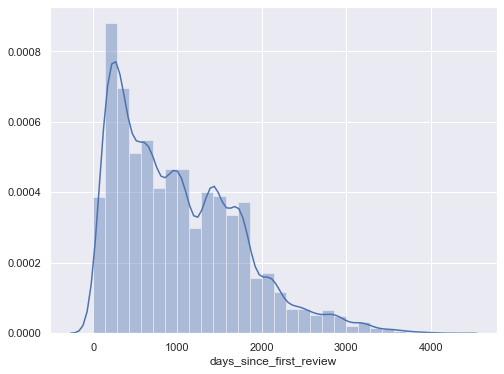

In [58]:
# Distribution of the number of days since first review
sns.set()
plt.figure(figsize=(8,6))
sns.distplot(df['days_since_first_review'], bins=30);


In [59]:
def bin_column(col, bins, labels, na_label='unknown'):
    
    """
        1. Group into bins.
        2. Label each period of time for each bin.
        3. Fill missing values with custom label.
    """
    
    df[col] = pd.cut(df[col], bins=bins, labels=labels, include_lowest=True)
    df[col] = df[col].astype('str')
    df[col].fillna(na_label, inplace=True)

In [60]:
# Binning time since first review
bin_column('days_since_first_review',
           bins=[0, 182, 365, 730, 1460, max(df.days_since_first_review)],
           labels=['0-6 months',
                   '6-12 months',
                   '1-2 years',
                   '2-3 years',
                   '4+ years'],
           na_label='no reviews')

In [61]:
df.days_since_first_review.value_counts()

2-3 years      11410
nan            11317
4+ years        9956
1-2 years       7692
6-12 months     5573
0-6 months      3576
Name: days_since_first_review, dtype: int64

In [62]:
df.days_since_first_review.isnull().sum()

0

In [63]:
df.last_review = pd.to_datetime(df.last_review) # Converting to datetime

# Calculating the number of days between the most recent review and the date the data was scraped
df['days_since_last_review'] = (datetime(2020, 6, 9) - df.last_review).astype('timedelta64[D]')

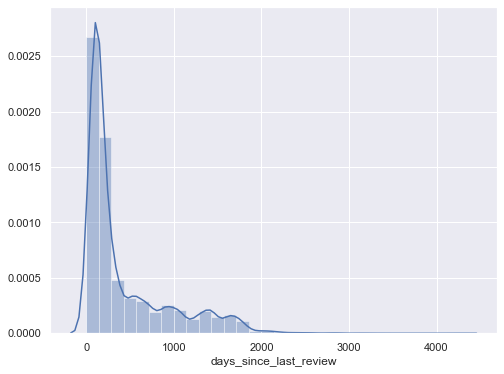

In [64]:
# Distribution of the number of days since last review
sns.set()
plt.figure(figsize=(8,6))
sns.distplot(df['days_since_last_review'], bins=30);

In [65]:
# Binning time since last review
bin_column('days_since_last_review',
           bins=[0, 14, 60, 182, 365, max(df.days_since_last_review)],
           labels=['0-2 weeks',
                   '2-8 weeks',
                   '2-6 months',
                   '6-12 months',
                   '1+ year'],
           na_label='no reviews')

In [66]:
for col in ['days_since_last_review', 'days_since_first_review']:
    df[col].replace('nan', 'nan_value', inplace=True)

In [67]:
# Dropping last_review
df.drop('last_review', axis=1, inplace=True)

In [68]:
df.first_review.isnull().sum()

11317

In [69]:
df.first_review.value_counts()

2020-01-01    187
2019-01-01    142
2018-01-01    141
2016-01-02    128
2020-01-02    121
             ... 
2011-03-06      1
2013-08-10      1
2012-09-12      1
2014-02-26      1
2010-10-24      1
Name: first_review, Length: 3162, dtype: int64

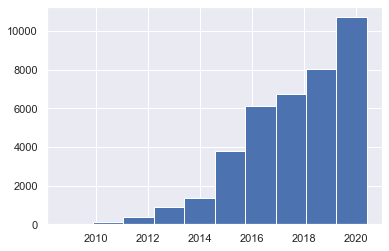

In [70]:
df.first_review.hist();

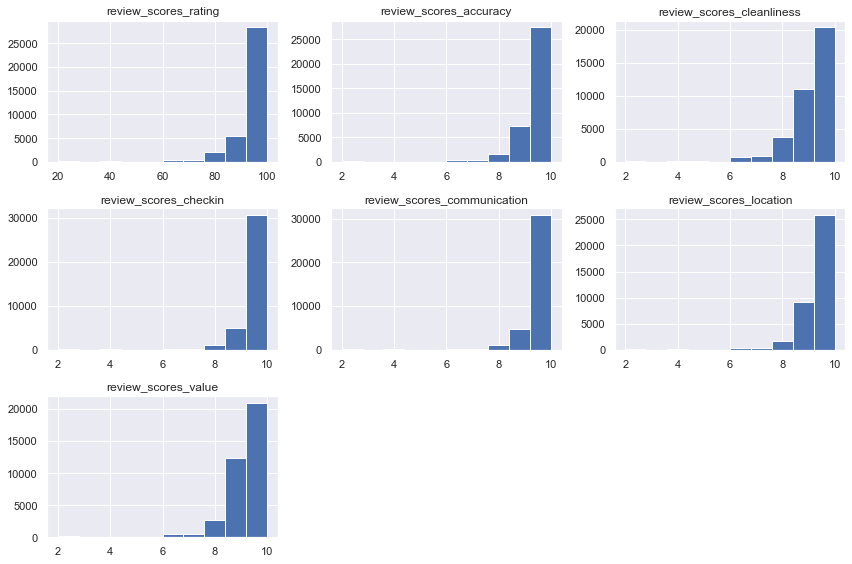

In [71]:
# Checking the distributions of the review ratings columns
variables_to_plot = list(df.columns[df.columns.str.startswith("review_scores") == True])
fig = plt.figure(figsize=(12,8))
for i, var_name in enumerate(variables_to_plot):
    ax = fig.add_subplot(3,3,i+1)
    df[var_name].hist(bins=10,ax=ax)
    ax.set_title(var_name)
fig.tight_layout()
plt.show()

In [72]:
# Creating a list of all review columns that are scored out of 10
variables_to_plot.pop(0)

'review_scores_rating'

In [73]:
# Binning for all columns scored <= 10
for col in variables_to_plot:
    bin_column(col,
               bins=[0, 8, 9, 10],
               labels=['0-8/10', '9/10', '10/10'],
               na_label='no review')

In [74]:
# Binning column scored out of 100
bin_column('review_scores_rating',
           bins=[0, 80, 95, 100],
           labels=['0-79/100', '80-94/100', '95-100/100'],
           na_label='no review')

In [75]:
df.review_scores_rating.value_counts()

95-100/100    21096
80-94/100     13146
nan           12283
0-79/100       2999
Name: review_scores_rating, dtype: int64

In [76]:
df.review_scores_rating.isnull().sum()

0

In [77]:
df.review_scores_rating.replace('nan', 'nan_value', inplace=True)

In [78]:
df.review_scores_rating.value_counts()

95-100/100    21096
80-94/100     13146
nan_value     12283
0-79/100       2999
Name: review_scores_rating, dtype: int64

In [79]:
df.review_scores_value.value_counts()

10/10     20939
9/10      12354
nan       12332
0-8/10     3899
Name: review_scores_value, dtype: int64

In [80]:
df.review_scores_value.value_counts()

10/10     20939
9/10      12354
nan       12332
0-8/10     3899
Name: review_scores_value, dtype: int64

In [81]:
df.review_scores_value.isnull().sum()

0

In [82]:
for col in ['review_scores_value', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location']:
    df[col].replace('nan', 'nan_value', inplace=True)

In [83]:
df.review_scores_accuracy.value_counts()

10/10        27373
nan_value    12317
9/10          7270
0-8/10        2564
Name: review_scores_accuracy, dtype: int64

In [84]:
df.cancellation_policy.value_counts()

strict_14_with_grace_period    21573
flexible                       16505
moderate                       11372
super_strict_60                   58
super_strict_30                   15
strict                             1
Name: cancellation_policy, dtype: int64

In [85]:
# Replacing categories
df.cancellation_policy.replace({
    'super_strict_30': 'strict_14_with_grace_period',
    'super_strict_60': 'strict_14_with_grace_period',
    'strict': 'strict_14_with_grace_period'
    }, inplace=True)

In [86]:
df.drop(['number_of_reviews_ltm', 'reviews_per_month'], axis=1, inplace=True)

In [87]:
print(f"The first host joined on {min(df.host_since).strftime('%d %B %Y')}, and the most recent joined on {max(df.host_since).strftime('%d %B %Y')}.")

The first host joined on 18 August 2008, and the most recent joined on 07 June 2020.


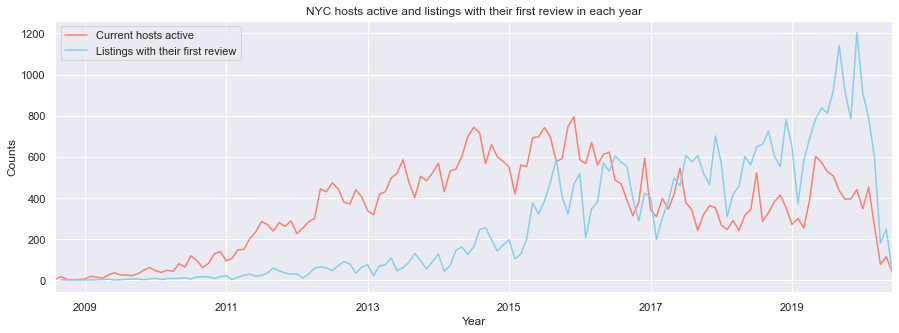

In [88]:
plt.figure(figsize=(15,5))
df.set_index('host_since').resample('MS').size().plot(label='Current hosts active', color='salmon')
df.set_index('first_review').resample('MS').size().plot(label='Listings with their first review', color='skyblue')
plt.title('NYC hosts active and listings with their first review in each year')
plt.legend()
plt.xlim('2008-08-01', '2020-06-09') 
plt.xlabel('Year')
plt.ylabel('Counts')
plt.savefig('current_host.png', dpi=300)
plt.show()

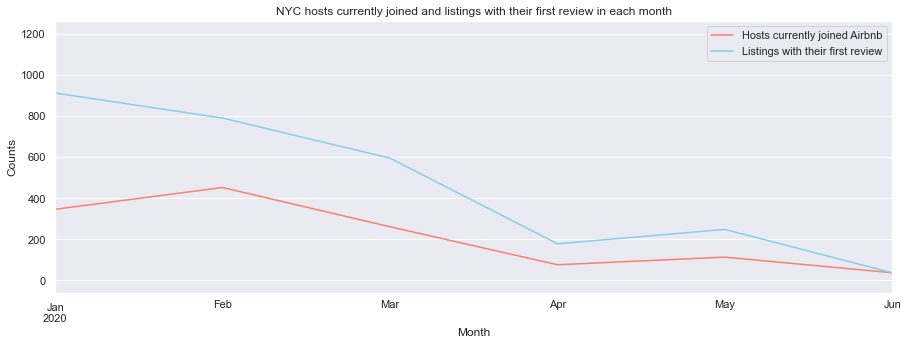

In [89]:
plt.figure(figsize=(15,5))
df.set_index('host_since').resample('MS').size().plot(label='Hosts currently joined Airbnb', color='salmon')
df.set_index('first_review').resample('MS').size().plot(label='Listings with their first review', color='skyblue')
plt.title('NYC hosts currently joined and listings with their first review in each month')
plt.legend()
plt.xlim('2020-01-01', '2020-06-30') 
plt.xlabel('Month')
plt.ylabel('Counts')
plt.savefig('current_joined.png', dpi=300)
plt.show()

In [90]:
print("Average number of listings per host per year on Airbnb in NYC:")
print(round(df.set_index('host_since').host_listings_count.resample('YS').mean(),2))

Average number of listings per host per year on Airbnb in NYC:
host_since
2008-01-01     3.52
2009-01-01     1.84
2010-01-01     2.01
2011-01-01     2.99
2012-01-01     3.99
2013-01-01     8.53
2014-01-01     8.31
2015-01-01    34.13
2016-01-01    61.76
2017-01-01    10.48
2018-01-01    13.62
2019-01-01     3.41
2020-01-01     1.15
Freq: AS-JAN, Name: host_listings_count, dtype: float64


In [91]:
# List of the largest host_listings_count and the year the host joined Airbnb
df.sort_values('host_listings_count').drop_duplicates('host_listings_count',keep='last').tail(10)[['host_since', 'host_listings_count']]

,host_since,host_listings_count
id,,
21996644,2016-09-16,424.0
27659298,2014-02-14,437.0
43106544,2013-10-14,480.0
43475493,2015-03-30,580.0
6117496,2015-04-07,653.0
33216902,2014-12-14,688.0
31038347,2016-12-16,1230.0
41559383,2014-01-03,1717.0
41106442,2018-06-11,1866.0


How have prices changed over time?

C:\Users\loisn\AppData\Roaming\Python\Python38\site-packages\pandas\core\series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


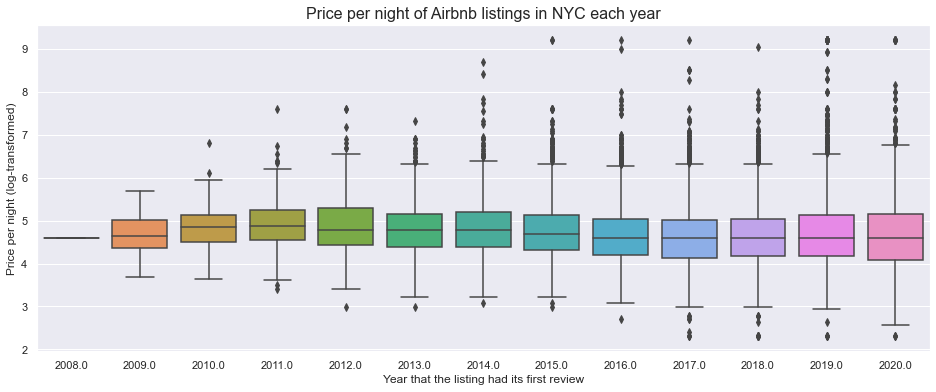

In [92]:
plt.figure(figsize=(16,6))
sns.boxplot(df.first_review.dt.year, np.log(df.price))
plt.xlabel('Year that the listing had its first review', fontsize=12)
plt.ylabel('Price per night (log-transformed)', fontsize=12)
plt.title('Price per night of Airbnb listings in NYC each year', fontsize=16)
plt.show()

In [93]:
print("Average price per night of listings in each year on Airbnb in NYC:")
print(round(df.set_index('first_review').price.resample('YS').mean(),2))

Average price per night of listings in each year on Airbnb in NYC:
first_review
2008-01-01    100.00
2009-01-01    121.54
2010-01-01    144.97
2011-01-01    162.05
2012-01-01    161.67
2013-01-01    150.30
2014-01-01    156.18
2015-01-01    147.33
2016-01-01    136.74
2017-01-01    129.61
2018-01-01    132.29
2019-01-01    167.21
2020-01-01    188.00
Name: price, dtype: float64


In [94]:
# Dropping host_since and first_review as they are no longer needed
df.drop(['host_since', 'first_review'], axis=1, inplace=True)

In [95]:
df.isnull().sum()

host_response_time             0
host_response_rate             0
host_is_superhost              0
host_listings_count            0
neighbourhood                  0
neighbourhood_group            0
property_type                  0
room_type                      0
accommodates                   0
bathrooms                      0
bedrooms                       0
beds                           0
price                          0
security_deposit               0
cleaning_fee                   0
guests_included                0
extra_people                   0
minimum_nights                 0
maximum_nights                 0
availability_30                0
number_of_reviews              0
review_scores_rating           0
review_scores_accuracy         0
review_scores_cleanliness      0
review_scores_checkin          0
review_scores_communication    0
review_scores_location         0
review_scores_value            0
cancellation_policy            0
host_active_days               0
air_condit

In [96]:
df.to_csv('prep_final.csv', index=False, encoding='utf-8')

Numerical Features

In [97]:
df.describe()

,host_is_superhost,host_listings_count,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,...,elevator,gym,child_friendly,parking,host_greeting,internet,long_term_stays,pets_allowed,private_entrance,self_check_in
count,49524.000000,49524.000000,49524.000000,49524.000000,49524.000000,49524.000000,49524.000000,49524.000000,49524.000000,49524.000000,...,49524.000000,49524.000000,49524.000000,49524.000000,49524.000000,49524.000000,49524.000000,49524.000000,49524.000000,49524.000000
mean,0.191483,18.143748,2.836483,1.148998,1.186233,1.532489,162.651967,177.614207,54.937969,1.500424,...,0.256603,0.101809,0.245659,0.432578,0.136035,0.975830,0.201801,0.179489,0.220923,0.203679
std,0.393472,135.457329,1.875267,0.435268,0.766625,1.135178,419.336518,442.760528,65.603354,1.154371,...,0.436763,0.302400,0.430481,0.495438,0.342829,0.153579,0.401349,0.383765,0.414873,0.402737
min,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,2.000000,1.000000,1.000000,1.000000,68.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,1.000000,2.000000,1.000000,1.000000,1.000000,101.000000,0.000000,40.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,2.000000,4.000000,1.000000,1.000000,2.000000,175.000000,200.000000,80.000000,2.000000,...,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1941.000000,22.000000,15.500000,21.000000,40.000000,10000.000000,5100.000000,1000.000000,16.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


What's overall distribution of prices in NYC?

In [98]:
# Prices range per night
print(f'Prices range from ${min(df.price)} to ${max(df.price)}.')

Prices range from $0.0 to $10000.0.


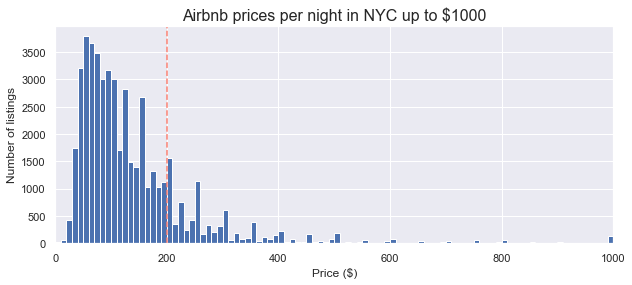

In [99]:
# Distribution of prices from $0 to $1000
plt.figure(figsize=(10,4))
df.price.hist(bins=100, range=(0,1000))
plt.margins(x=0)
plt.axvline(200, color='salmon', linestyle='--')
plt.title("Airbnb prices per night in NYC up to $1000", fontsize=16)
plt.xlabel("Price ($)")
plt.ylabel("Number of listings")
plt.show()

In [100]:
df.price.value_counts()

100.0     2165
150.0     2089
50.0      1620
200.0     1402
75.0      1390
          ... 
1569.0       1
5250.0       1
2300.0       1
13.0         1
860.0        1
Name: price, Length: 663, dtype: int64

In [101]:
# Replacing values under $10 with $10
df.loc[df.price <= 10, 'price'] = 10

# Replacing values over $1000 with $1000
df.loc[df.price >= 1000, 'price'] = 1000

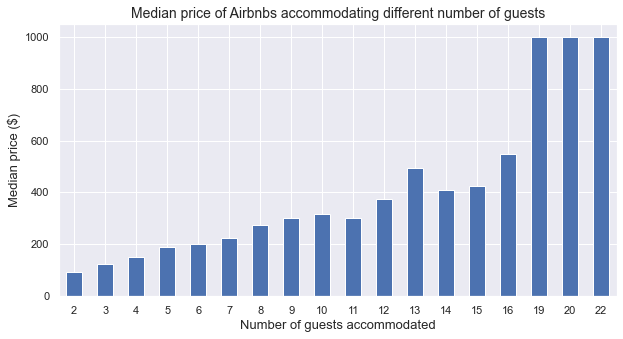

In [102]:
plt.figure(figsize=(10,5))
df.groupby('accommodates').price.median().plot(kind='bar')
plt.title('Median price of Airbnbs accommodating different number of guests', fontsize=14)
plt.xlabel('Number of guests accommodated', fontsize=13)
plt.ylabel('Median price ($)', fontsize=13)
plt.xticks(rotation=0)
plt.xlim(left=0.5)
plt.show()

In [103]:
df.accommodates.value_counts()

2     22835
1      7701
4      7444
3      5316
6      2412
5      1958
8       710
7       458
10      234
16      151
12      103
9        99
11       37
14       31
13       17
15       15
20        1
19        1
22        1
Name: accommodates, dtype: int64

In [104]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49524 entries, 2060 to 43703359
Data columns (total 48 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   host_response_time           49524 non-null  object 
 1   host_response_rate           49524 non-null  object 
 2   host_is_superhost            49524 non-null  float64
 3   host_listings_count          49524 non-null  float64
 4   neighbourhood                49524 non-null  object 
 5   neighbourhood_group          49524 non-null  object 
 6   property_type                49524 non-null  object 
 7   room_type                    49524 non-null  object 
 8   accommodates                 49524 non-null  int64  
 9   bathrooms                    49524 non-null  float64
 10  bedrooms                     49524 non-null  float64
 11  beds                         49524 non-null  float64
 12  price                        49524 non-null  float64
 13  security_d

In [105]:
df.isnull().sum()

host_response_time             0
host_response_rate             0
host_is_superhost              0
host_listings_count            0
neighbourhood                  0
neighbourhood_group            0
property_type                  0
room_type                      0
accommodates                   0
bathrooms                      0
bedrooms                       0
beds                           0
price                          0
security_deposit               0
cleaning_fee                   0
guests_included                0
extra_people                   0
minimum_nights                 0
maximum_nights                 0
availability_30                0
number_of_reviews              0
review_scores_rating           0
review_scores_accuracy         0
review_scores_cleanliness      0
review_scores_checkin          0
review_scores_communication    0
review_scores_location         0
review_scores_value            0
cancellation_policy            0
host_active_days               0
air_condit

In [106]:
# Read geographic dataset
nbhoods = gpd.read_file('../NYC/data/neighbourhoods.geojson')
nbhoods.head()

,neighbourhood,neighbourhood_group,geometry
0,Bayswater,Queens,"MULTIPOLYGON (((-73.76671 40.61491, -73.76825 ..."
1,Allerton,Bronx,"MULTIPOLYGON (((-73.84860 40.87167, -73.84582 ..."
2,City Island,Bronx,"MULTIPOLYGON (((-73.78282 40.84392, -73.78257 ..."
3,Ditmars Steinway,Queens,"MULTIPOLYGON (((-73.90160 40.76777, -73.90391 ..."
4,Ozone Park,Queens,"MULTIPOLYGON (((-73.83754 40.69136, -73.83108 ..."


In [107]:
nbhoods.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [108]:
# Concat df_latlong and df
df_latlong_combined = pd.merge(df, df_latlong, how='inner', on='id')
df_latlong_combined.head()

,host_response_time,host_response_rate,host_is_superhost,host_listings_count,neighbourhood,neighbourhood_group,property_type,room_type,accommodates,bathrooms,...,host_greeting,internet,long_term_stays,pets_allowed,private_entrance,self_check_in,days_since_first_review,days_since_last_review,latitude,longitude
id,,,,,,,,,,,,,,,,,,,,,
2060,a few days or more,0-49%,0.0,0.0,Washington Heights,Manhattan,Others,Private room,2,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,4+ years,1+ year,40.85722,-73.93790
2595,within a few hours,50-89%,0.0,6.0,Midtown,Manhattan,Apartment,Entire home/apt,2,1.0,...,0.0,1.0,1.0,0.0,0.0,1.0,4+ years,6-12 months,40.75362,-73.98377
3831,within an hour,90-99%,0.0,1.0,Clinton Hill,Brooklyn,Others,Entire home/apt,3,1.0,...,0.0,1.0,1.0,1.0,0.0,1.0,4+ years,0-2 weeks,40.68514,-73.95976
5099,unknown,unknown,0.0,1.0,Murray Hill,Manhattan,Apartment,Entire home/apt,2,1.0,...,1.0,1.0,0.0,0.0,0.0,0.0,4+ years,6-12 months,40.74767,-73.97500
5121,unknown,unknown,0.0,1.0,Bedford-Stuyvesant,Brooklyn,Apartment,Private room,2,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,4+ years,6-12 months,40.68688,-73.95596


In [109]:
# Create geodataframe 
df_geo = gpd.GeoDataFrame(df_latlong_combined, geometry=gpd.points_from_xy(df_latlong_combined.longitude, 
                                                                 df_latlong_combined.latitude))

# Columns for spatial analysis
cols = ['price', 'neighbourhood', 'neighbourhood_group', 'geometry']
df_geo = df_geo[cols]
df_geo.shape

(49524, 4)

In [110]:
df_geo.head()

,price,neighbourhood,neighbourhood_group,geometry
id,,,,
2060,100.0,Washington Heights,Manhattan,POINT (-73.93790 40.85722)
2595,225.0,Midtown,Manhattan,POINT (-73.98377 40.75362)
3831,89.0,Clinton Hill,Brooklyn,POINT (-73.95976 40.68514)
5099,200.0,Murray Hill,Manhattan,POINT (-73.97500 40.74767)
5121,60.0,Bedford-Stuyvesant,Brooklyn,POINT (-73.95596 40.68688)


In [111]:
print(df_geo.crs)

None


In [112]:
# Set up epsg for geodataframe
df_geo.crs = CRS('epsg:2829')
df_geo.crs

<Projected CRS: EPSG:2829>
Name: NAD83(HARN) / New York Central
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: USA - New York - SPCS - C
- bounds: (-77.75, 41.99, -75.04, 44.41)
Coordinate Operation:
- name: SPCS83 New York Central zone (meters)
- method: Transverse Mercator
Datum: NAD83 (High Accuracy Reference Network)
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [113]:
#Set up epsg for neighbourhoods
nbhoods.crs = CRS('epsg:2829')
nbhoods.crs

<Projected CRS: EPSG:2829>
Name: NAD83(HARN) / New York Central
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: USA - New York - SPCS - C
- bounds: (-77.75, 41.99, -75.04, 44.41)
Coordinate Operation:
- name: SPCS83 New York Central zone (meters)
- method: Transverse Mercator
Datum: NAD83 (High Accuracy Reference Network)
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [114]:
nbhoods.neighbourhood_group.value_counts()

Queens           55
Bronx            50
Brooklyn         48
Staten Island    48
Manhattan        32
Name: neighbourhood_group, dtype: int64

In [115]:
df_geo_group = df_geo.groupby('neighbourhood')[['price']].median()

df_price_cloropeth = pd.merge(nbhoods, df_geo_group,
                              left_on='neighbourhood', right_index=True)

df_price_cloropeth.head()

,neighbourhood,neighbourhood_group,geometry,price
0,Bayswater,Queens,"MULTIPOLYGON (((-73.76671 40.61491, -73.76825 ...",65.0
22,Bayswater,Queens,"MULTIPOLYGON (((-73.76507 40.61357, -73.76502 ...",65.0
1,Allerton,Bronx,"MULTIPOLYGON (((-73.84860 40.87167, -73.84582 ...",75.0
2,City Island,Bronx,"MULTIPOLYGON (((-73.78282 40.84392, -73.78257 ...",100.0
44,City Island,Bronx,"MULTIPOLYGON (((-73.78457 40.85972, -73.78471 ...",100.0


In [116]:
def plot_coloropeth_borough(borough_name, ax, pos):
    
    if borough_name == "all":
        ax = df_price_cloropeth.plot(ax=ax, 
                                     figsize=(15,15), 
                                     column='price', 
                                     cmap='PuBu', 
                                     scheme='quantiles',
                                     edgecolor='aqua',
                                     legend=True, 
                                     legend_kwds = pos
                                    )
    else:
        ax = df_price_cloropeth[df_price_cloropeth.neighbourhood_group \
                                == borough_name].plot(ax=ax, 
                                                      figsize=(10,8), 
                                                      column='price', 
                                                      cmap='PuBu', 
                                                      scheme='quantiles',   
                                                      edgecolor='aqua',
                                                      legend=True, 
                                                      legend_kwds = pos
                                                     )

    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    return ax

In [117]:
pos = {
    "all": {'loc':'upper left'},
    "Manhattan": {'loc':'upper left'},
    "Brooklyn": {'loc':'lower right'},
    "Bronx": {'loc':'upper right'},
    "Queens": {'loc':'lower left'},
    "Staten Island": {'loc':'lower right'}
}

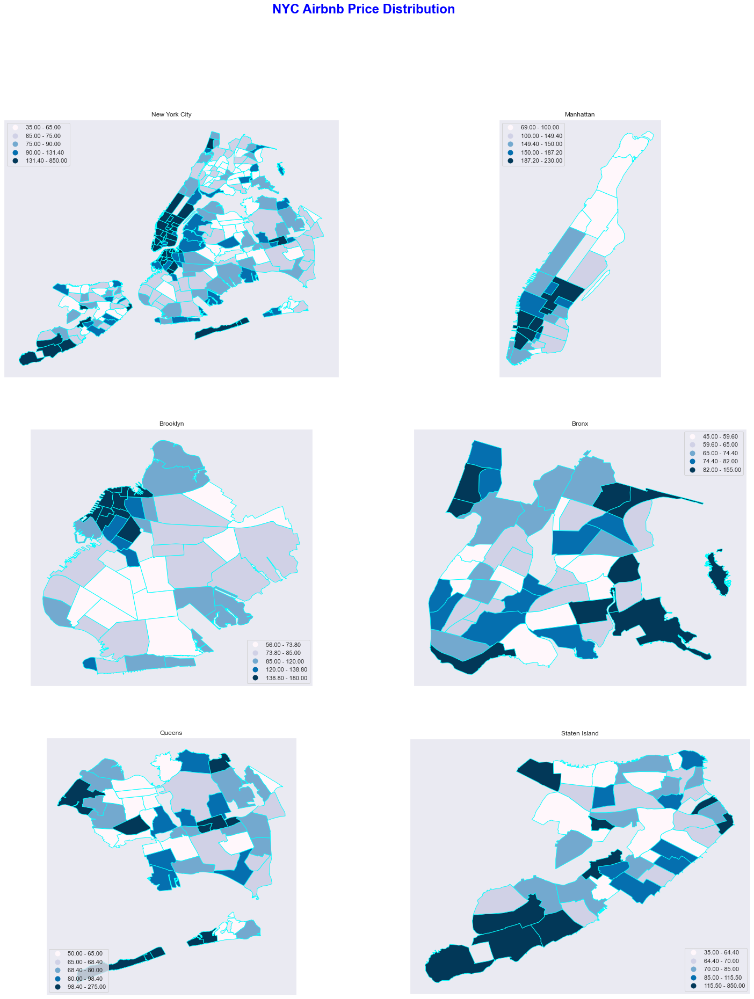

In [118]:
fig, axes = plt.subplots(3, 2)
fig.set_size_inches(25, 30)
axes[0,0] = plot_coloropeth_borough("all", axes[0,0], pos["all"])
axes[0,0].set_title("New York City")
axes[0,1] = plot_coloropeth_borough("Manhattan", axes[0,1], pos["Manhattan"])
axes[0,1].set_title("Manhattan")
axes[1,0] = plot_coloropeth_borough("Brooklyn", axes[1,0], pos["Brooklyn"])
axes[1,0].set_title("Brooklyn")
axes[1,1] = plot_coloropeth_borough("Bronx", axes[1,1], pos["Bronx"])
axes[1,1].set_title("Bronx")
axes[2,0] = plot_coloropeth_borough("Queens", axes[2,0], pos["Queens"])
axes[2,0].set_title("Queens")
axes[2,1] = plot_coloropeth_borough("Staten Island", axes[2,1], pos["Staten Island"])
axes[2,1].set_title("Staten Island")

plt.suptitle("NYC Airbnb Price Distribution", 
             fontsize=24, fontweight='bold', color='Blue')

plt.savefig('price_dist.png', dpi=300, bbox_inches='tight')

plt.show()

In [119]:
# Instantiate NYC map 
nyc_map = folium.Map(location=[df_latlong_combined['latitude'].mean(), df_latlong_combined['longitude'].mean()], zoom_start=12)

# Show superhost's location 
df_superhost = df_latlong_combined[df_latlong_combined.host_is_superhost == 1.0] 
mc = MarkerCluster()
for row in df_superhost.itertuples():
    mc.add_child(folium.Marker(location=[row.latitude,  row.longitude],
                              popup='superhost'))
                              #icon = folium.Icon(color='red', icon='info-sign')))
nyc_map.add_child(mc)
nyc_map

In [120]:
#nyc_map.save('nyc_map.html')

In [121]:
df.head()

,host_response_time,host_response_rate,host_is_superhost,host_listings_count,neighbourhood,neighbourhood_group,property_type,room_type,accommodates,bathrooms,...,child_friendly,parking,host_greeting,internet,long_term_stays,pets_allowed,private_entrance,self_check_in,days_since_first_review,days_since_last_review
id,,,,,,,,,,,,,,,,,,,,,
2060,a few days or more,0-49%,0.0,0.0,Washington Heights,Manhattan,Others,Private room,2,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,4+ years,1+ year
2595,within a few hours,50-89%,0.0,6.0,Midtown,Manhattan,Apartment,Entire home/apt,2,1.0,...,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,4+ years,6-12 months
3831,within an hour,90-99%,0.0,1.0,Clinton Hill,Brooklyn,Others,Entire home/apt,3,1.0,...,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,4+ years,0-2 weeks
5099,unknown,unknown,0.0,1.0,Murray Hill,Manhattan,Apartment,Entire home/apt,2,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,4+ years,6-12 months
5121,unknown,unknown,0.0,1.0,Bedford-Stuyvesant,Brooklyn,Apartment,Private room,2,1.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,4+ years,6-12 months


In [122]:
list(df)

['host_response_time',
 'host_response_rate',
 'host_is_superhost',
 'host_listings_count',
 'neighbourhood',
 'neighbourhood_group',
 'property_type',
 'room_type',
 'accommodates',
 'bathrooms',
 'bedrooms',
 'beds',
 'price',
 'security_deposit',
 'cleaning_fee',
 'guests_included',
 'extra_people',
 'minimum_nights',
 'maximum_nights',
 'availability_30',
 'number_of_reviews',
 'review_scores_rating',
 'review_scores_accuracy',
 'review_scores_cleanliness',
 'review_scores_checkin',
 'review_scores_communication',
 'review_scores_location',
 'review_scores_value',
 'cancellation_policy',
 'host_active_days',
 'air_conditioning',
 'bed_linen',
 'tv',
 'coffee_machine',
 'cooking_basics',
 'white_goods',
 'elevator',
 'gym',
 'child_friendly',
 'parking',
 'host_greeting',
 'internet',
 'long_term_stays',
 'pets_allowed',
 'private_entrance',
 'self_check_in',
 'days_since_first_review',
 'days_since_last_review']

In [123]:
def count_price_plot(col, figsize=(8,6)):
    """
       1.Counting values of each categorical variables
       2.Return true/false label
       3.Compare the price between true/false counts 
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    fig.suptitle(col, fontsize=16, y=1)
    plt.subplots_adjust(top=0.80) 
    
    df.groupby(col).size().plot(kind='bar', ax=ax1, color=['lightsalmon', 'skyblue'])
    ax1.set_xticklabels(labels=['False', 'True'], rotation=0)
    ax1.set_title('Count')
    ax1.set_xlabel('')
    
    df.groupby(col).price.median().plot(kind='bar', ax=ax2, color=['lightsalmon', 'skyblue'])
    ax2.set_xticklabels(labels=['False', 'True'], rotation=0)
    ax2.set_title('Median price ($)')
    ax2.set_xlabel('')
    
    plt.show()

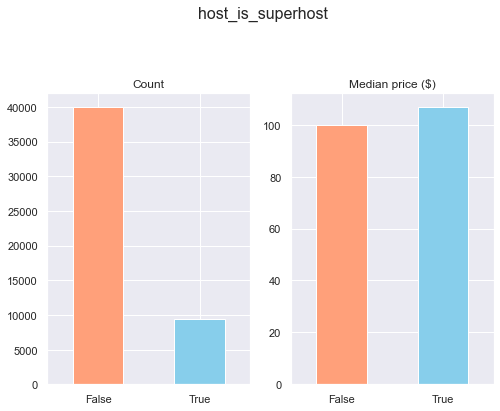

0.0    0.808517
1.0    0.191483
Name: host_is_superhost, dtype: float64

In [124]:
count_price_plot('host_is_superhost')
df.host_is_superhost.value_counts(normalize=True)

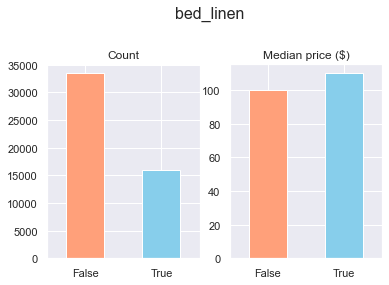

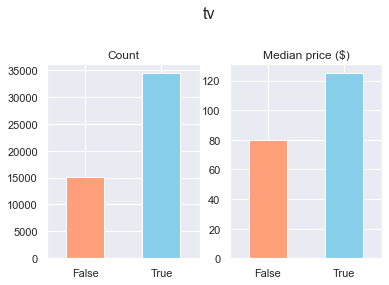

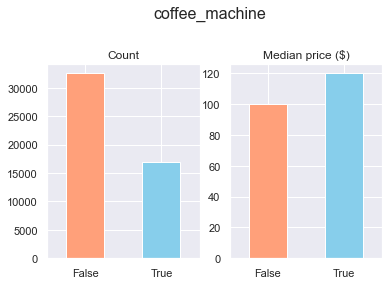

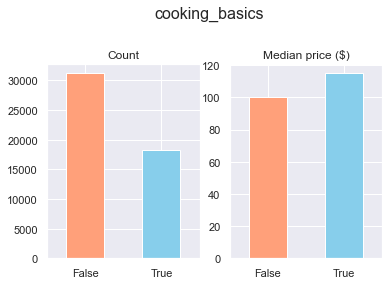

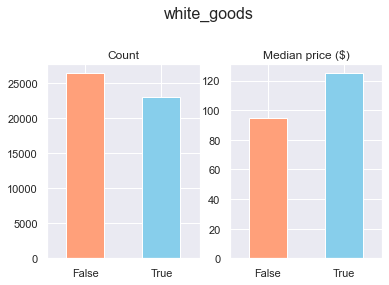

...

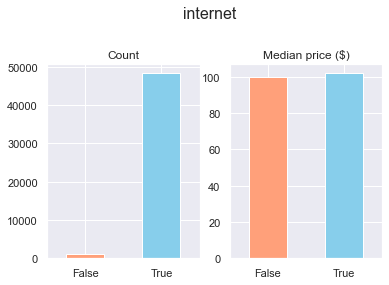

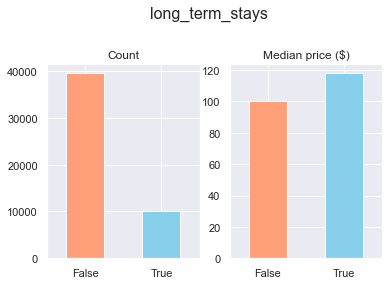

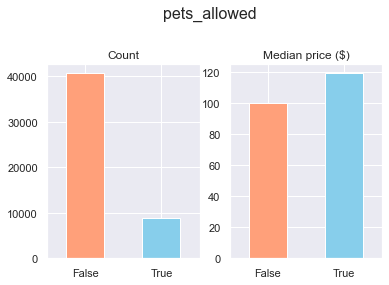

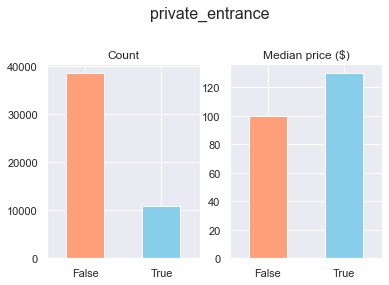

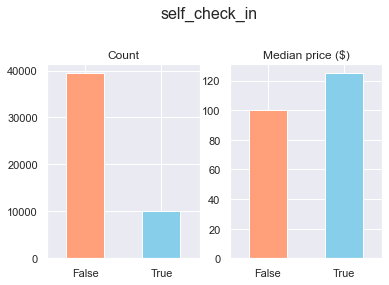

In [125]:
for col in df.iloc[:,31:-2].columns:
    count_price_plot(col, figsize=(6,4))

In [126]:
def category_plot(col):
    plt.figure(figsize=(8,6))
    plot_count = df[col].value_counts()
    sns.barplot(plot_count.index, plot_count.values)
    plt.title(col)
    plt.xticks(rotation=0)
    plt.show()

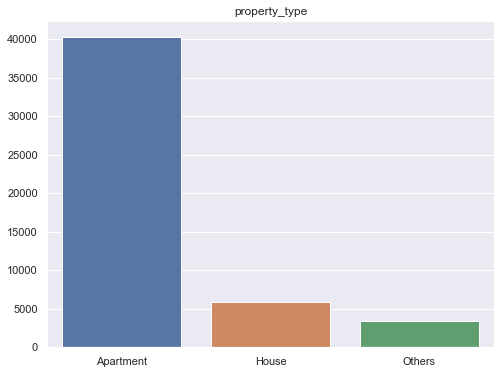

Apartment    0.813929
House        0.117701
Others       0.068371
Name: property_type, dtype: float64


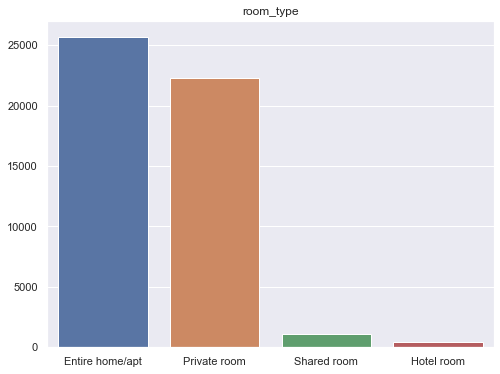

Entire home/apt    0.519203
Private room       0.449802
Shared room        0.022292
Hotel room         0.008703
Name: room_type, dtype: float64


In [127]:
for col in ['property_type', 'room_type']:
    category_plot(col)
    print(df[col].value_counts(normalize=True))

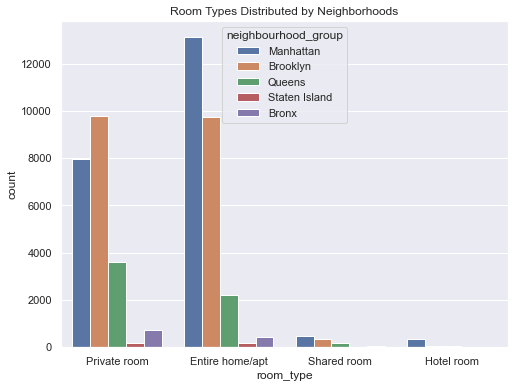

In [128]:
# Room type across neighborhoods
plt.figure(figsize=(8,6))
sns.countplot(x = 'room_type', hue = "neighbourhood_group", data = df)
plt.title("Room Types Distributed by Neighborhoods")
#plt.savefig('room_type_nbhood.png', dpi=300)
plt.show()

In [129]:
df.review_scores_rating.value_counts()

95-100/100    21096
80-94/100     13146
nan_value     12283
0-79/100       2999
Name: review_scores_rating, dtype: int64

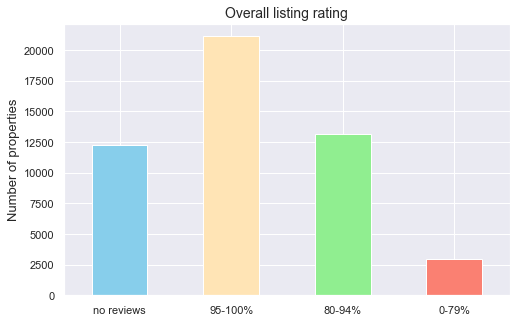

In [130]:
fig, ax = plt.subplots(1, 1, figsize=(8,5))
ax.set_title('Overall listing rating', fontsize=14)
df['review_scores_rating'].value_counts().sort_index(ascending=False).plot(kind='bar', color=['skyblue', 'moccasin', 'lightgreen', 'salmon' ], ax=ax)
ax.set_xticklabels(labels=['no reviews', '95-100%', '80-94%','0-79%'], rotation=0)
ax.set_xlabel('')
ax.set_ylabel('Number of properties', fontsize=13)
plt.show()

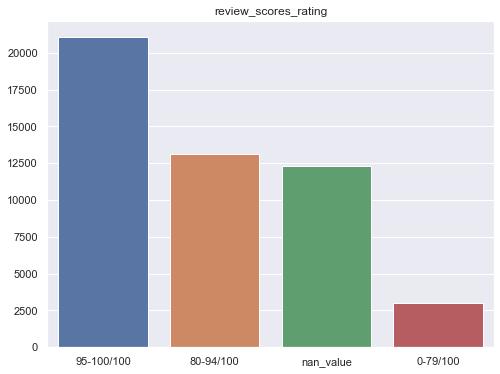

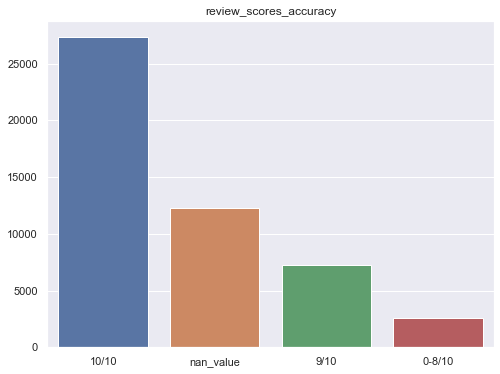

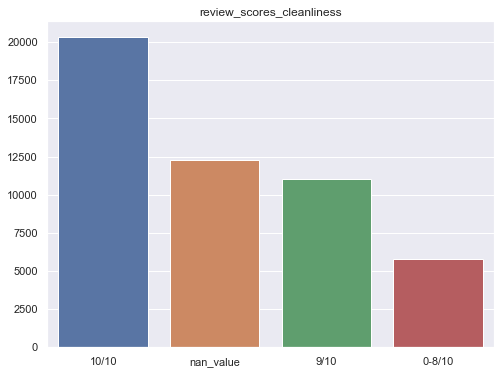

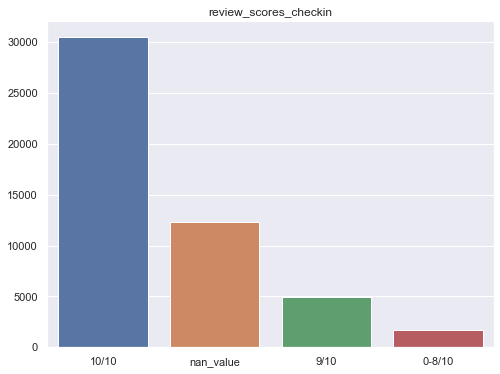

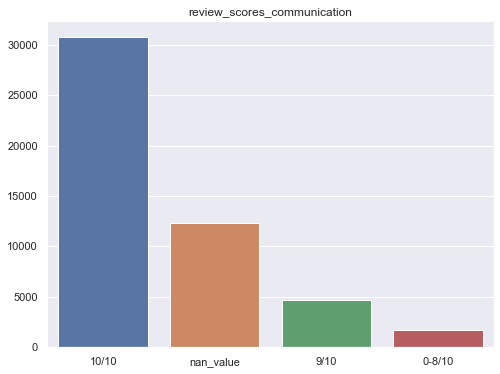

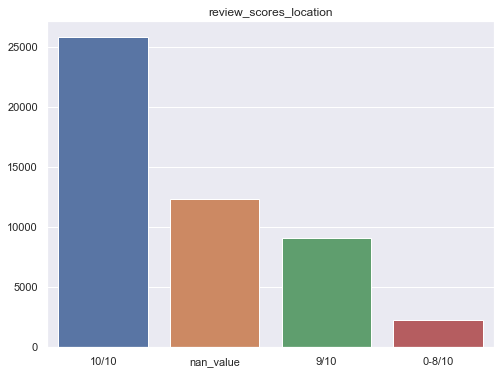

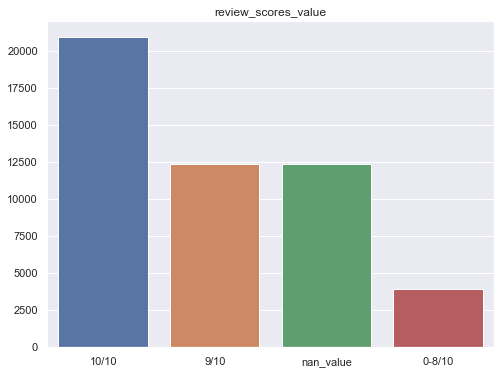

In [131]:
for col in list(df.columns[df.columns.str.startswith("review_scores") == True]):
    category_plot(col)

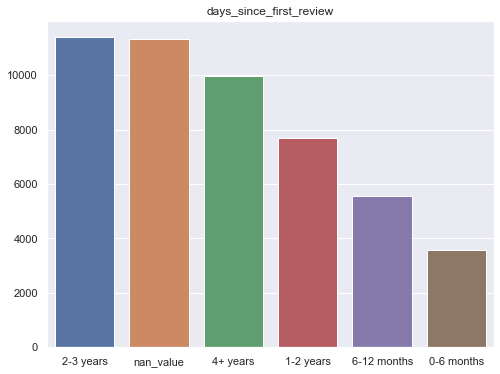

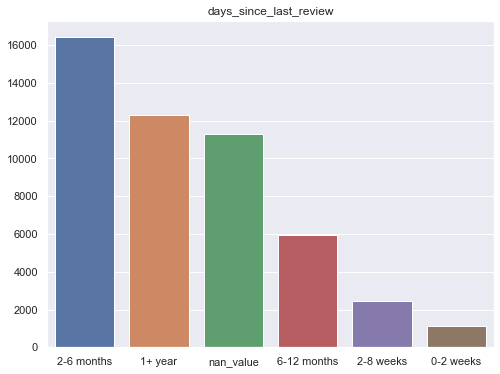

In [132]:
for col in ['days_since_first_review', 'days_since_last_review']:
    category_plot(col)